# <a href="https://miptstats.github.io/courses/ad_fivt.html">Введение в анализ данных</a>
## Домашнее задание 3. Простой анализ данных.

**Правила, <font color="red">прочитайте внимательно</font>:**

* Выполненную работу нужно отправить телеграм-боту `@miptstats_ds23_bot`. Для начала работы с ботом каждый раз отправляйте `/start`. Дождитесь подтверждения от бота, что он принял файл. Если подтверждения нет, то что-то не так. **Работы, присланные иным способом, не принимаются.**
* Дедлайн см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно **ноутбук в формате `ipynb`**.
* Телеграм не разрешает боту получать файлы более **20 Мб**. Если ваше решение весит больше, *заранее* разделите ноутбук на несколько.
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания все участники списывания будут сдавать устный зачет.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Для выполнения задания **используйте этот ноутбук в качестве основы, ничего не удаляя из него**. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*

**Перед выполнением задания посмотрите презентацию по выполнению и оформлению домашних заданий с занятия 2.**

---

**Баллы за задание:**

<b><font color="blue">Легкая часть</font></b> (достаточно на "хор"):
* Задача 1 &mdash; 60 баллов

<b><font color="orange">Сложная часть</font></b> (необходимо на "отл"):
* Задача 2 &mdash; 80 баллов

---

In [130]:
# Bot check

# HW_ID: fpmi_ad3
# Бот проверит этот ID и предупредит, если случайно сдать что-то не то

# Status: final
# Перед отправкой в финальном решении удали "not" в строчке выше
# Так бот проверит, что ты отправляешь финальную версию, а не промежуточную

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

sns.set(style='whitegrid', font_scale=1.3, palette='Set2')
%matplotlib inline

### <font color="blue"><i>Легкая часть</i></font>


### Задача 1.

На занятии мы уже <a href="https://miptstats.github.io/courses/ad_fivt/titanik.html" target="_blank">начинали</a> работать с датасетом Титаник. Сейчас ваша задача &mdash; на основе простого анализа предоставленных данных получить некоторое приближенное правило определения, выжил пассажир или нет.

#### 1. Подготовка данных

Загрузите данные с помощью `pandas`.

In [3]:
df = pd.read_csv('3_ex/train.csv')
df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


Разделите данные по строкам на две части случайным образом в соотношении 7:3. Первую часть мы будем называть *обучающей*, а вторую &mdash; *тестовой*.

In [4]:
train_df = df.loc[np.random.choice(df.shape[0], round(df.shape[0]*7/10), replace=False)]
test_df = pd.concat([df, train_df]).drop_duplicates(keep=False)

test_df.reset_index(drop=True, inplace=True)
train_df.reset_index(drop=True, inplace=True)

In [5]:
test_df.shape[0], train_df.shape[0], df.shape[0]

(267, 624, 891)

Из каждой части оставим несколько признаков, с которыми мы будем работать, а также отдельно &mdash; целевой признак. Примените к обеим частям таблицы функцию ниже

In [6]:
features_columns = ['Pclass', 'Sex', 'Age', 'SibSp', 'Parch', 'Fare']
target_column = 'Survived'  # Целевой признак

def get_features_and_target(data):
    features = data[features_columns]
    target = data[target_column]
    return features, target

X_train, y_train = get_features_and_target(train_df) 
X_test, y_test = get_features_and_target(test_df) 
X_train.head()

,Pclass,Sex,Age,SibSp,Parch,Fare
0,3,female,41.0,0,5,39.6875
1,1,male,45.0,0,0,26.5500
2,3,female,NaN,0,0,7.8792
3,3,male,23.5,0,0,7.2292
4,3,male,44.0,0,1,16.1000


#### 2. Исследование

**Внимание.** Эта часть задачи должна выполняться *исключительно на обучающих данных*. За использование тестовых данных решение не будет оценено.

Проведите визуальный анализ данных чтобы понять, как различные признаки влияют на целевой. Исследовать можно не целиком обучающие данные, а разделить их на две части по одному из признаков, а далее рассматривать каждую часть отдельно. 

*Не забывайте про информативность и эстетичность графиков.*

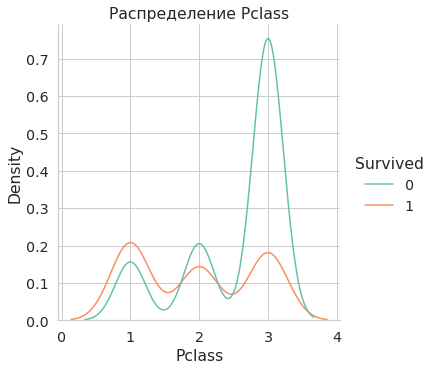

In [84]:
with sns.axes_style('whitegrid'):
    fig = sns.displot(data=train_df, x="Pclass", hue="Survived", kind="kde")
    plt.title("Распределение Pclass")
    plt.show()

None

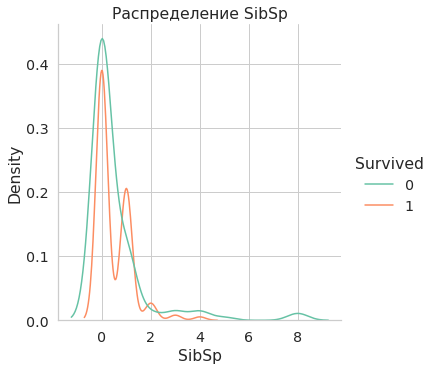

In [85]:
with sns.axes_style('whitegrid'):
    fig = sns.displot(data=train_df, x="SibSp", hue="Survived", kind="kde")
    plt.title("Распределение SibSp")

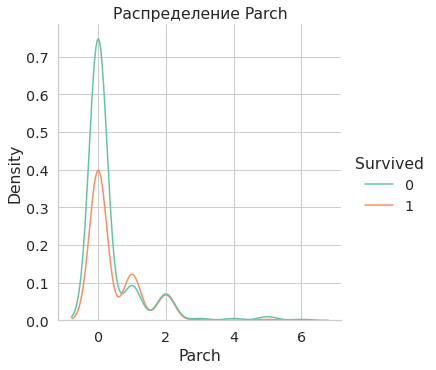

In [86]:
with sns.axes_style('whitegrid'):
    fig = sns.displot(data=train_df, x="Parch", hue="Survived", kind="kde")
    plt.title('Распределение Parch')

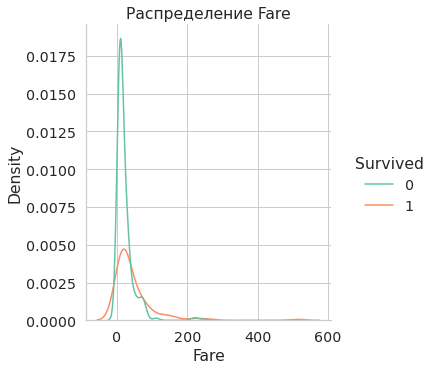

In [87]:
with sns.axes_style('whitegrid'):
    fig = sns.displot(data=train_df, x="Fare", hue="Survived", kind="kde")
    plt.title('Распределение Fare')

Pclass - класс пассажира

Sex	 - пол пассажира

Age	- возраст пассажира

SibSp - кол-во братьев/сестер/супруг на Титанике

Parch - кол-во родителей/детей на Титанике

Fare - плата за проезд

## **Посмотрим на долю выживших пассажиров Титаника, в зависимости от различных попарных сочетаний признаков**
 При визуализации с помощью heatmap будем иметь в виду, что статическую ценность имеют значения, которые были неоднократно воспроизведены

Будем считать, что влияние двух величин, откладываемых по горизонтали и вертикали, имеет статистическую значимость, если для данных двух значений имеется **больше 20 наблюдений**. Сочетания, наблюдений для которых меньше 20 будем визуализировать на heatmap с помощью значения "-1"  

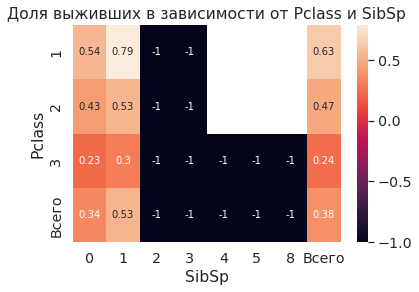

In [101]:
pivot_sibsp_pclass = pd.pivot_table(
    data=train_df, 
    values='Survived', 
    columns='SibSp',
    index='Pclass',  
    aggfunc=lambda a: -1 if len(a) < 20 else np.sum(a)/len(a), 
    margins=True,
    margins_name="Всего"
)

ax = plt.axes()
sns.heatmap(pivot_sibsp_pclass, annot=True, ax=ax, fmt='.2g')
ax.set_title('Доля выживших в зависимости от Pclass и SibSp')
None

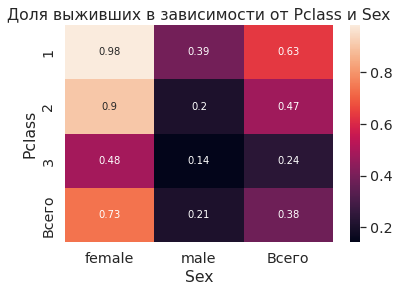

In [100]:
pivot_sex_pclass = pd.pivot_table(
    data=train_df, 
    values='Survived', 
    columns='Sex',
    index='Pclass',  
    aggfunc=lambda a: -1 if len(a) < 20 else np.sum(a)/len(a),  #np.sum
    margins=True,
    margins_name="Всего"
)

ax = plt.axes()
sns.heatmap(pivot_sex_pclass, annot=True, ax=ax, fmt='.2g')
ax.set_title('Доля выживших в зависимости от Pclass и Sex')
None

In [14]:
train_df.query("Sex == 'female' and Pclass < 3")

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
14,62,1,1,"Icard, Miss. Amelie",female,38.0,0,0,113572,80.0000,B28,NaN
33,843,1,1,"Serepeca, Miss. Augusta",female,30.0,0,0,113798,31.0000,NaN,C
42,358,0,2,"Funk, Miss. Annie Clemmer",female,38.0,0,0,237671,13.0000,NaN,S
46,313,0,2,"Lahtinen, Mrs. William (Anna Sylfven)",female,26.0,1,1,250651,26.0000,NaN,S
51,436,1,1,"Carter, Miss. Lucile Polk",female,14.0,1,2,113760,120.0000,B96 B98,S
...,...,...,...,...,...,...,...,...,...,...,...,...
600,531,1,2,"Quick, Miss. Phyllis May",female,2.0,1,1,26360,26.0000,NaN,S
606,137,1,1,"Newsom, Miss. Helen Monypeny",female,19.0,0,2,11752,26.2833,D47,S
609,609,1,2,"Laroche, Mrs. Joseph (Juliette Marie Louise La...",female,22.0,1,2,SC/Paris 2123,41.5792,NaN,C
617,384,1,1,"Holverson, Mrs. Alexander Oskar (Mary Aline To...",female,35.0,1,0,113789,52.0000,NaN,S


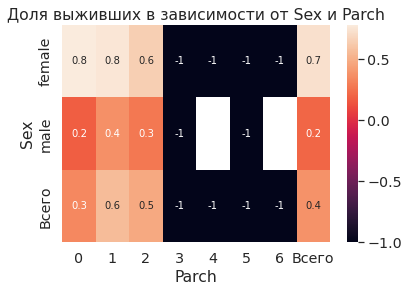

In [99]:
pivot_parch_sex = pd.pivot_table(
    data=train_df, 
    values='Survived', 
    columns='Parch',
    index='Sex',  
    aggfunc=lambda a: -1 if len(a) < 20 else np.sum(a)/len(a), 
    margins=True,
    margins_name="Всего"
)

ax = plt.axes()
sns.heatmap(pivot_parch_sex, annot=True, ax=ax, fmt='.1g')
ax.set_title('Доля выживших в зависимости от Sex и Parch')
None

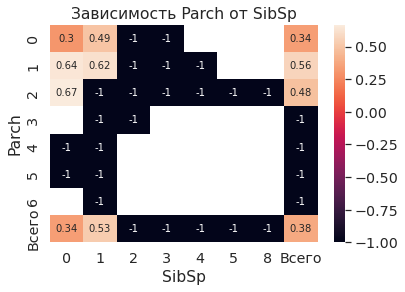

In [92]:
pivot_sibsp_parch = pd.pivot_table(
    data=train_df, 
    values='Survived', 
    columns='SibSp',
    index='Parch',  
    aggfunc=lambda a: -1 if len(a) < 20 else np.sum(a)/len(a), 
    margins=True,
    margins_name="Всего"
)

ax = plt.axes()
sns.heatmap(pivot_sibsp_parch, annot=True, ax=ax, fmt='.2g')
ax.set_title('Доля выживших в зависимости от Parch и SibSp')
None

**С помощью выше расположенных графиков явно прослеживается, что вероятность того, что выживет женщина больше вероятности выживания мужчины**

Попробуем улучшить эту закономерность, рассмотрим от чего зависит выживаемость у женщин.
Далее, будем визуализировать выживаемость с помощью heatmap **только для женщин**.

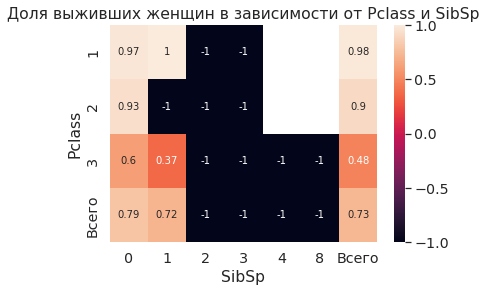

In [96]:
pivot_sibsp_pclass_women = pd.pivot_table(
    data=train_df[train_df['Sex'] == 'female'], 
    values='Survived', 
    columns='SibSp',
    index='Pclass',  
    aggfunc=lambda a: -1 if len(a) < 20 else np.sum(a)/len(a), 
    margins=True,
    margins_name="Всего"
)

ax = plt.axes()
sns.heatmap(pivot_sibsp_pclass_women, annot=True, ax=ax, fmt='.2g')
ax.set_title('Доля выживших женщин в зависимости от Pclass и SibSp')
None

Заметим, что женщины, путешествовавшие в 1 и 2 классах обслуживания в большинстве своём выжили, посмотрим как обстоят дела с теми, кто тутешествовал в 3 классе

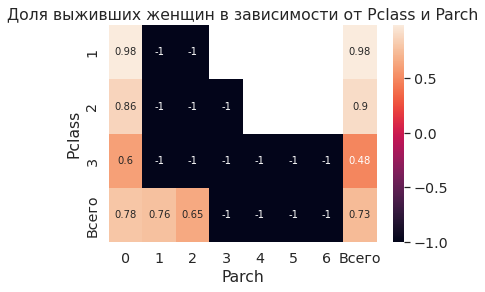

In [98]:
pivot_parch_pclass_women = pd.pivot_table(
    data=train_df[train_df['Sex'] == 'female'], 
    values='Survived', 
    columns='Parch',
    index='Pclass',  
    aggfunc=lambda a: -1 if len(a) < 20 else np.sum(a)/len(a), 
    margins=True,
    margins_name="Всего"
)

ax = plt.axes()
sns.heatmap(pivot_parch_pclass_women, annot=True, ax=ax, fmt='.2g')
ax.set_title('Доля выживших женщин в зависимости от Pclass и Parch')
None

Для женщин, путешествовавших в 3 классе более выгодно предсказывать, что они выживут, если Parch = 0, иначе будем предсказывать, что они утонут

Посмотрим от чего зависит выживаемость мужчин, будем рисовать heatmap **только для мужчин**

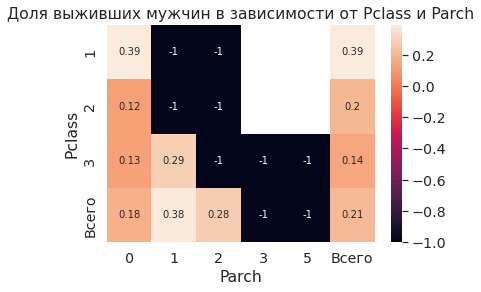

In [97]:
pivot_parch_pclass_men = pd.pivot_table(
    data=train_df[train_df['Sex'] != 'female'], 
    values='Survived', 
    columns='Parch',
    index='Pclass',  
    aggfunc=lambda a: -1 if len(a) < 20 else np.sum(a)/len(a), 
    margins=True,
    margins_name="Всего"
)
ax = plt.axes()
sns.heatmap(pivot_parch_pclass_men, annot=True, ax=ax, fmt='.2g')
ax.set_title('Доля выживших мужчин в зависимости от Pclass и Parch')
None

Text(0.5, 1.0, 'Для мужчин')

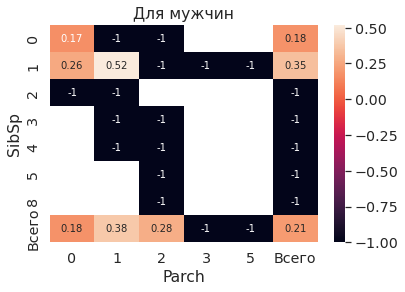

In [52]:
pivot_parch_pclass_men = pd.pivot_table(
    data=train_df[train_df['Sex'] != 'female'], 
    values='Survived', 
    columns='Parch',
    index='SibSp',  
    aggfunc=lambda a: -1 if len(a) < 20 else np.sum(a)/len(a), 
    margins=True,
    margins_name="Всего"
)
ax = plt.axes()
sns.heatmap(pivot_parch_pclass_men, annot=True, ax=ax, fmt='.2g')
ax.set_title('Для мужчин')

Видно, что в большинстве случаев **мужчина умирает на Титанике вне зависимости от обстоятельств**

#### 3. Классификация

На основе проведенного исследования предложите два разных правила в виде решающего дерева, пример которого можете посмотреть в презентации с первой лекции (классификация котиков). Никакие статистические методы использовать не требуется, только логику и графики.

В данной задаче достаточно, если первое дерево будет иметь максимальную глубину 2, а второе &mdash; глубину 1, и при этом не является поддеревом первого. *Примечание*: дерево из одного листа имеет глубину 0.

**Дерево 1:**
![title](3_ex/pic/real_first_tree.png)


**Дерево 2:**
![title](3_ex/pic/sec_tree_real)


Реализуйте полученные деревья по шаблону

In [47]:
def first_tree(features):
    '''
    Предсказание целевого признака для данных features -- pandas-таблица данных.
    Возвращает pandas.Series с теми же индексами, что и у features.
    '''
    def f(features):
        if features.Sex == 'female':
            if features.Pclass < 3:
                return 1
            else:
                if features.Parch == 0:
                    return 1
                else:
                    return 0
        else:
            return 0
    return features.apply(f, axis=1)

def second_tree(features):
    '''
    Предсказание целевого признака для данных features -- pandas-таблица данных.
    Возвращает pandas.Series с теми же индексами, что и у features.
    '''
    def f(features):
        if features.SibSp == 1:
            if features.Pclass < 3:
                return 1
            else:
                return 0
        return 0
    
    return features.apply(f, axis=1)

In [48]:
X_train.head()

,Pclass,Sex,Age,SibSp,Parch,Fare
0,3,female,41.0,0,5,39.6875
1,1,male,45.0,0,0,26.5500
2,3,female,NaN,0,0,7.8792
3,3,male,23.5,0,0,7.2292
4,3,male,44.0,0,1,16.1000


#### 4. Качество

Вспомним, что у нас имеется тестовая часть выборки. Самое время ее использовать для того, чтобы оценить, насколько хорошими получились деревья. Предложите какой-нибудь критерий качества.

*Замечание*. Не стоит пытаться искать, какие критерии существуют. В данном случае легко предложить адекватный критерий. Стандартные критерии мы разберем позже, но для начала лучше подумать самостоятельно.

**Критерий:**

**Количество совпавших результатов target и predicted, отнесенное к количеству всех результатов**

Реализуйте данный критерий по шаблону

In [49]:
def criteria(target, predicted):
    '''
    Вычисление критерия качества для предсказания predicted, 
    если истинные значения -- target.
    Возвращает одно вещественное число.
    '''
    return len(target[target==predicted])/len(target)

Посчитайте качество полученных ранее деревьев.

*Примечание.* Полученные значения не влияют на оценку по задание. Оценивается только корректность и обоснованность решения, а также графики и выводы.

In [50]:
criteria(y_test, second_tree(X_test))

0.6629213483146067

In [51]:
criteria(y_test, first_tree(X_test))

0.8202247191011236

**5. Метод ближайшего соседа**

В домашнем задании 1 вы уже реализовали функцию поиска ближайших соседей. Теперь давайте применим ее для решения нашей текущей задачи. 

Реализуйте функцию, которая для каждого объекта тестового набора данных найдет $k$ ближайших соседей из обучающего набора данных, и в качестве ответа возьмет наиболее часто встречающееся значение целевого признака среди найденных соседей. Обратите внимание, что соседей необходимо искать только среди объектов обучающего набора данных.

In [28]:
def knn(features, train_features, train_target, k=1):
    '''
    Предсказание целевого признака для данных features -- pandas-таблица данных.
    на основе обучающего набора данных train_features, train_target.
    Возвращает pandas.Series с теми же индексами, что и у features.
    Число k -- количество соседей.
    '''
    def find_nearest_points(A: np.ndarray, B: np.ndarray, k: int) -> np.ndarray:    
        distance = np.sqrt(np.add.outer(np.sum(B ** 2, axis=1), np.sum(A ** 2, axis=1)) - 2*np.inner(B, A))

        ind = np.argsort(distance)
        return ind[:, :k]
    
    # нашли k индексов ближайших соседей выборки train_features
    # взять среднее от значений train_target по этим индексам
    predicted = pd.DataFrame(find_nearest_points(train_features, features, k)) \
                        .apply(lambda k: round(train_target[k].mean()), axis=1)
    
    return predicted

Посчитайте значение предложенного ранее критерия качества для метода ближайшего соседа для значений $k$ от 1 до 10. Постройте график зависимости критерия качества от $k$. Как вы можете пояснить полученные результаты?

------------------------------------------
Подготовим данные по-новой, так как KNN работает только на хороших данных, в отличие от деревьев, сделаем one-hot кодирование для пола и удалим NaNы из столбца возраста

Затем, заново осуществим разделение на трэйновую и тестовую выборки, на которых обучим KNN и замерим его качество

In [29]:
df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [30]:
clear_df = pd.get_dummies(df, columns=['Sex'], drop_first=True)
clear_df.dropna(subset=['Age'],inplace=True)
clear_df.reset_index(inplace=True, drop=True)
clear_df.head()

,PassengerId,Survived,Pclass,Name,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Sex_male
0,1,0,3,"Braund, Mr. Owen Harris",22.0,1,0,A/5 21171,7.2500,NaN,S,1
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",38.0,1,0,PC 17599,71.2833,C85,C,0
2,3,1,3,"Heikkinen, Miss. Laina",26.0,0,0,STON/O2. 3101282,7.9250,NaN,S,0
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",35.0,1,0,113803,53.1000,C123,S,0
4,5,0,3,"Allen, Mr. William Henry",35.0,0,0,373450,8.0500,NaN,S,1


In [31]:
features_columns = ['Pclass', 'Sex_male', 'Age', 'SibSp', 'Parch', 'Fare']


clear_train_df = clear_df.loc[np.random.choice(clear_df.shape[0], round(clear_df.shape[0]*7/10), replace=False)]
clear_test_df = pd.concat([clear_df, clear_train_df]).drop_duplicates(keep=False)

clear_test_df.reset_index(drop=True, inplace=True)
clear_train_df.reset_index(drop=True, inplace=True)

clear_X_train, clear_y_train = get_features_and_target(clear_train_df) 
clear_X_test, clear_y_test = get_features_and_target(clear_test_df)

In [32]:
clear_train_df.head()

,PassengerId,Survived,Pclass,Name,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Sex_male
0,524,1,1,"Hippach, Mrs. Louis Albert (Ida Sophia Fischer)",44.0,0,1,111361,57.9792,B18,C,0
1,835,0,3,"Allum, Mr. Owen George",18.0,0,0,2223,8.3000,NaN,S,1
2,499,0,1,"Allison, Mrs. Hudson J C (Bessie Waldo Daniels)",25.0,1,2,113781,151.5500,C22 C26,S,0
3,825,0,3,"Panula, Master. Urho Abraham",2.0,4,1,3101295,39.6875,NaN,S,1
4,461,1,1,"Anderson, Mr. Harry",48.0,0,0,19952,26.5500,E12,S,1


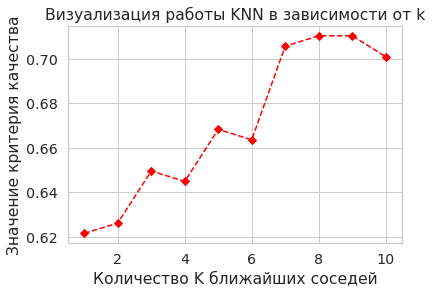

In [46]:
x, y = [], []
for k in range(1, 11):
    x.append(k)
    y.append(criteria(clear_y_test, knn(clear_X_test.to_numpy(), clear_X_train.to_numpy(), 
                                        clear_y_train, k=k)))
plt.xlabel('Количество K ближайших соседей')
plt.ylabel('Значение критерия качества')
plt.title('Визуализация работы KNN в зависимости от k')
plt.xlim([0.5, 10.5])
plt.plot(x, y, 'rD--')
None

In [102]:
clear_X_train.mean(), clear_X_train.std()

(Pclass       2.264000
 Sex_male     0.624000
 Age         29.607000
 SibSp        0.486000
 Parch        0.448000
 Fare        35.276249
 dtype: float64,
 Pclass       0.829264
 Sex_male     0.484865
 Age         14.844946
 SibSp        0.909648
 Parch        0.885926
 Fare        56.700249
 dtype: float64)

#### 6. Выводы

В ходе исследования были предсказаны значения целевой переменной Survived двумя различными способами.

* **С помощью деревьев**: 

    + Первое дерево, глубиной 3, дало значение метрики 0.82, можно проследить, что данное дерево довольно хорошо описывает закономерности, выявленные в данных
    + Второе дерево, глубиной 2, дало значение метрики 0.66, это значит, что оно так же улавливает общую закономерность в данных, так как показатель лучше, чем показатель случайного классификатора ($\approx 0.5$), но всё же модель предсказывает не очень точно
* **С помощью KNN**:
    + Значение метрики для KNN варьируются от 0.62 до 0.71 при изменении числа соседей от 1 до 10. Такое относительно низкое качество было получено из-за того, что KNN по своей сути является метрическим алгоритмом, в отличие от деревьев, для правильной его работы важно очистить данные от пропусков, осуществлить one-hot кодирование, а также большое влияние играет нормализация данных. Можно заметить, что наши же данные имели разный диапазон значений, что повлияло на результаты предсказаний. После нормализации показания KNN скорее всего могут улучшиться.


---
### <font color="orange"><i>Сложная часть</i></font>

### Задача 2

<a target="_blank" href="yelp.com">Yelp</a> — веб-сайт для поиска на местном рынке услуг, например ресторанов или парикмахерских, с возможностью добавлять и просматривать рейтинги и обзоры этих услуг. Для популярных бизнесов имеются сотни обзоров. Для обозревателей на сайте предусмотрены элементы социальной сети.

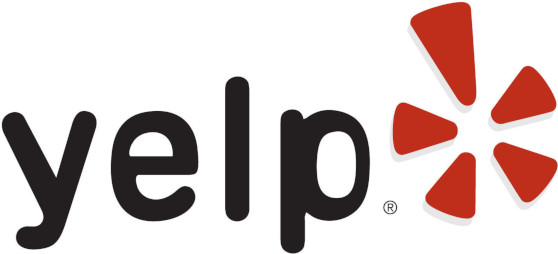

_____________

Вам предоставляется следующая информация о компаниях на Yelp:

Файл `yelp_business.csv`:
* `business_id` — уникальный идентификатор компании;
* `name` — имя компании;
* `address`, `city`, `state` — месторасположении компании;
* `latitude`, `longitude` — географические координаты;
* `categories` — категории услуг компании.

Файл `yelp_review.csv`, содержащий оценки пользователей:
* `business_id` — идентификатор компании, соответствующий файлу `yelp_business.csv`;
* `stars` — поставленная пользователем оценка от 1 до 5.

В целях сокращения объема файла, текстовые отзывы пользователей не были включены.

Оригинальную версию датасета в формате `json` можно посмотреть по <a target="_blank" href="https://www.kaggle.com/yelp-dataset/yelp-dataset/data">ссылке</a>.

_____________

**Что нужно сделать:** 

* Найти город с наибольшим количеством компаний;
* Для этого города определить районы с наиболее качественными услугами. <a target="_blank" href="https://yandex.ru/company/researches/2017/msk_mobile_map">Пример</a> с несколько другой задачей.
* А также найти рестораны с наилучшими отзывами.

------

#### Город с наибольшим количеством компаний

Загрузите данные из файла `yelp_business.csv` с помощью функции `pd.read_csv`. Посмотрите на первые несколько строк с помощью метода `head`.

In [103]:
df = pd.read_csv('3_ex/yelp_business.csv', index_col=0)
df.head()

,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories
0,FYWN1wneV18bWNgQjJ2GNg,"""Dental by Design""",NaN,"""4855 E Warner Rd, Ste B9""",Ahwatukee,AZ,85044,33.330690,-111.978599,1,Dentists;General Dentistry;Health & Medical;Or...
1,He-G7vWjzVUysIKrfNbPUQ,"""Stephen Szabo Salon""",NaN,"""3101 Washington Rd""",McMurray,PA,15317,40.291685,-80.104900,1,Hair Stylists;Hair Salons;Men's Hair Salons;Bl...
2,KQPW8lFf1y5BT2MxiSZ3QA,"""Western Motor Vehicle""",NaN,"""6025 N 27th Ave, Ste 1""",Phoenix,AZ,85017,33.524903,-112.115310,1,Departments of Motor Vehicles;Public Services ...
3,8DShNS-LuFqpEWIp0HxijA,"""Sports Authority""",NaN,"""5000 Arizona Mills Cr, Ste 435""",Tempe,AZ,85282,33.383147,-111.964725,0,Sporting Goods;Shopping
4,PfOCPjBrlQAnz__NXj9h_w,"""Brick House Tavern + Tap""",NaN,"""581 Howe Ave""",Cuyahoga Falls,OH,44221,41.119535,-81.475690,1,American (New);Nightlife;Bars;Sandwiches;Ameri...


Найдите пять городов, по которым присутствует информация о наибольшем количестве компаний. В таблице должен быть указан город (название) и количество компаний в этом городе.

*Подсказка.* Для выполнения стоит воспользоваться методами `groupby`, `count`, `sort_values`, `head`.

In [104]:
df.groupby(by='city').count().sort_values(by='business_id', ascending=False).head(5)

,business_id,name,neighborhood,address,state,postal_code,latitude,longitude,is_open,categories
city,,,,,,,,,,
Las Vegas,26775,26775,21887,26775,26775,26655,26775,26775,26775,26775
Phoenix,17213,17213,0,17213,17213,17121,17213,17213,17213,17213
Toronto,17206,17206,14064,17206,17206,17102,17205,17205,17206,17206
Charlotte,8553,8553,5844,8553,8553,8517,8553,8553,8553,8553
Scottsdale,8228,8228,0,8228,8228,8201,8228,8228,8228,8228


Пусть `N` &mdash; город с наибольшим количеством компаний. Оставьте в таблице только записи, соответствующие городу `N`. Нанесите все эти компании на график, в котором по оси $x$ отметьте долготу, а по оси $y$ &mdash; широту.

In [105]:
new_df = df[df.city == 'Las Vegas']
new_df.head()

,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories
6,kCoE3jvEtg6UVz5SOD3GVw,"""BDJ Realty""",Summerlin,"""2620 Regatta Dr, Ste 102""",Las Vegas,NV,89128,36.207430,-115.268460,1,Real Estate Services;Real Estate;Home Services...
7,OD2hnuuTJI9uotcKycxg1A,"""Soccer Zone""",NaN,"""7240 W Lake Mead Blvd, Ste 4""",Las Vegas,NV,89128,36.197484,-115.249660,1,Shopping;Sporting Goods
26,VBHEsoXQb2AQ76J9l8h1uQ,"""Alfredo's Jewelry""",Southeast,"""5775 S Eastern, Ste 103""",Las Vegas,NV,89119,36.085051,-115.119421,1,Shopping;Jewelry;Watch Repair;Local Services
41,1Jp_hmPNUZArNqzpbm7B0g,"""Task Electric""",Spring Valley,"""7260 Cimarron Rd, Ste 130""",Las Vegas,NV,89113,36.056382,-115.269332,1,Home Services;Lighting Fixtures & Equipment;Lo...
48,DPQnTnNw2PJj7DdENM98Cw,"""Star Nursery""",NaN,"""5340 Boulder Hwy""",Las Vegas,NV,89122,36.105196,-115.056880,1,Nurseries & Gardening;Home & Garden;Shopping


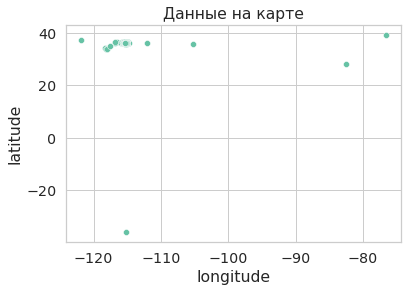

In [106]:
with sns.axes_style('whitegrid'):
    fig = sns.scatterplot(data=new_df, x="longitude", y='latitude')
    plt.title('Данные на карте')

Сам город находится в сгустке точек. Есть какие-то компании, которые приписаны к этому городу, но находятся далеко от него. Избавьтесь от них, подобрав некоторые границы значений широты и долготы. Изобразите все компании на новом графике. На этом графике должны выделяться некоторые улицы. 

In [108]:
data = new_df.query('(-115.4 < longitude < -115) & (35.9 < latitude < 36.35)')
data.head()

,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories
6,kCoE3jvEtg6UVz5SOD3GVw,"""BDJ Realty""",Summerlin,"""2620 Regatta Dr, Ste 102""",Las Vegas,NV,89128,36.207430,-115.268460,1,Real Estate Services;Real Estate;Home Services...
7,OD2hnuuTJI9uotcKycxg1A,"""Soccer Zone""",NaN,"""7240 W Lake Mead Blvd, Ste 4""",Las Vegas,NV,89128,36.197484,-115.249660,1,Shopping;Sporting Goods
26,VBHEsoXQb2AQ76J9l8h1uQ,"""Alfredo's Jewelry""",Southeast,"""5775 S Eastern, Ste 103""",Las Vegas,NV,89119,36.085051,-115.119421,1,Shopping;Jewelry;Watch Repair;Local Services
41,1Jp_hmPNUZArNqzpbm7B0g,"""Task Electric""",Spring Valley,"""7260 Cimarron Rd, Ste 130""",Las Vegas,NV,89113,36.056382,-115.269332,1,Home Services;Lighting Fixtures & Equipment;Lo...
48,DPQnTnNw2PJj7DdENM98Cw,"""Star Nursery""",NaN,"""5340 Boulder Hwy""",Las Vegas,NV,89122,36.105196,-115.056880,1,Nurseries & Gardening;Home & Garden;Shopping


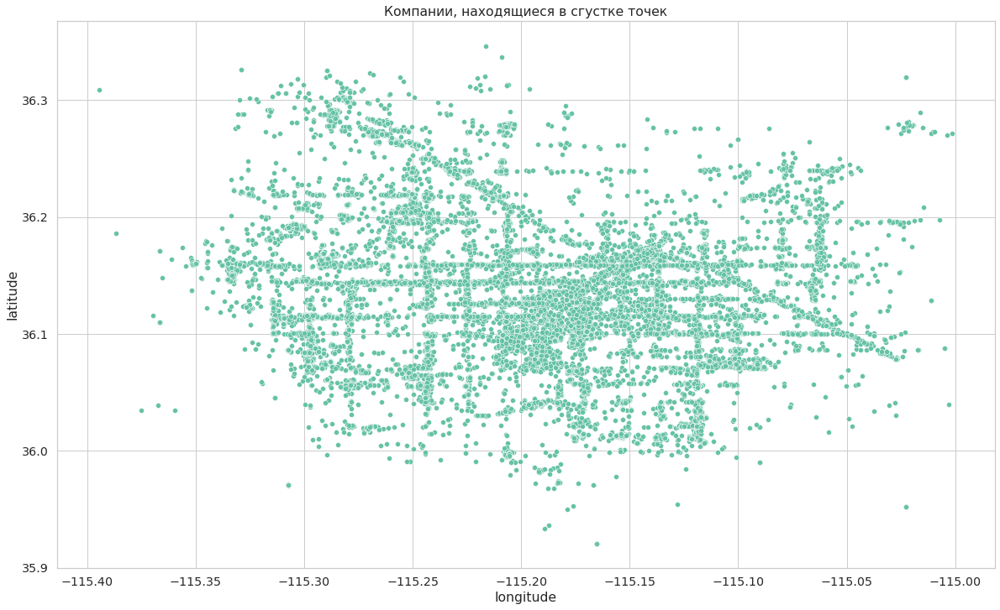

In [109]:
with sns.axes_style('whitegrid'):
    plt.figure(figsize=(20, 12))
    fig = sns.scatterplot(data=data, x="longitude", y='latitude')
    plt.title('Компании, находящиеся в сгустке точек')

Разберитесь с тем, как подгрузить интерактивную карту города в качестве фона графика. Можно пойти двумя следующими способами.
1. Изучить <a href="https://miptstats.github.io/courses/python/11_plotly.html" target="_blank">материалы</a> по библиотеке <a href="https://plotly.com/python/" target="_blank"><b>Plotly</b></a>. Возможно, потребуется также заглянуть в документацию.
1. Поразбираться с библиотекой <a href="https://github.com/python-visualization/folium" target="_blank"><b>Folium</b></a>. Посмотрите множество <a href="https://nbviewer.org/github/python-visualization/folium/tree/main/examples/" target="_blank">примеров</a>, может также помочь <a href="https://proglib.io/p/python-web-map" target="_blank">статья на русском</a>.

*Внимание!* Интерактивная карта может не сохраниться в ноутбуке, а если сохранится, то вес ноутбука может превзойти 20 Мб. Рекомендуется сохранить карту в html и отправить ее отдельным файлом в бот.

In [110]:
import plotly
import plotly.graph_objects as go
import plotly.express as px

In [111]:
fig = px.scatter_mapbox(data, lat='latitude', lon='longitude',
                     mapbox_style="stamen-terrain",
                     center=dict(lat=36.2, lon=-115.18), zoom=10)
fig.show()

Если все получилось, вы молодцы! Далее в этой задаче тоже можно делать интерактивные карты.

#### Оценки компаний

Для выполнения задания нужно посчитать среднюю оценку каждой компании, а также количество выставленных оценок.

Загрузите таблицу оценок `yelp_review.csv`.

In [112]:
review_df = pd.read_csv('3_ex/yelp_review.csv', index_col=1)
review_df.describe()

,Unnamed: 0,stars
count,5.261668e+06,5.261668e+06
mean,2.630834e+06,3.727739e+00
std,1.518913e+06,1.433593e+00
min,0.000000e+00,1.000000e+00
25%,1.315417e+06,3.000000e+00
50%,2.630834e+06,4.000000e+00
75%,3.946250e+06,5.000000e+00
max,5.261667e+06,5.000000e+00


В подгруженной таблице оценок оставьте только компании города `N`. Для этого установите значения `business_id` в качестве индекса у таблицы оценок и воспользуйтесь методом `loc`. 

*Подсказка.* Чтобы индекс снова сделать полем таблицы, можно воспользоваться методом `reset_index`.

In [113]:
review_df.head()

,Unnamed: 0,stars
business_id,,
AEx2SYEUJmTxVVB18LlCwA,0,5
VR6GpWIda3SfvPC-lg9H3w,1,5
CKC0-MOWMqoeWf6s-szl8g,2,5
ACFtxLv8pGrrxMm6EgjreA,3,4
s2I_Ni76bjJNK9yG60iD-Q,4,4


Теперь посчитайте среднюю оценку каждой компании, а также количество выставленных компании оценок. 

*Подсказка.* Помочь в этом могут функции `groupby` и `aggregate([np.mean, np.size])`.

In [114]:
review_df = review_df.groupby(by='business_id').aggregate([np.mean, np.size])['stars']

Назовите колонки таблицы красивыми именами, изменив `<имя таблицы>.columns`, после чего напечатайте несколько строк полученной таблицы. Красивые имена &mdash; то, что будет понятно простому человеку при чтении ваших результатов. Как именно их назвать &mdash; задача аналитика, то есть в данном случае ваша :)

In [115]:
review_df.columns = ['stars', 'count']

In [116]:
review_df.head()

,stars,count
business_id,,
--6MefnULPED_I942VcFNA,3.135135,37
--7zmmkVg-IMGaXbuVd0SQ,3.851064,47
--8LPVSo5i0Oo61X01sV9A,4.333333,3
--9QQLMTbFzLJ_oT-ON3Xw,3.363636,11
--9e1ONYQuAa-CB_Rrw7Tw,4.088904,1451


Соедините две полученные ранее таблицы по компаниям города `N` в одну.
Для этого сначала установите поле `business_id` в качестве индекса в обеих таблицах с помощью `set_index`. В одной из них это уже должно было быть сделано.
В полученной таблице должны получится поля `latitude`, `longitude`, `categories`, `name`, `stars`, `count`.

*Подсказка.* Соединение таблиц можно выполнить с помощью `join`.
Индексы у этих таблиц одинаковые, так что тип джойна не имеет значения.

In [117]:
data.set_index('business_id', inplace=True)

In [118]:
joined_df = data.join(review_df)
fields = ['latitude', 'longitude', 'categories', 'name', 'stars', 'count']
joined_df = joined_df[fields]
joined_df.head()

,latitude,longitude,categories,name,stars,count
business_id,,,,,,
kCoE3jvEtg6UVz5SOD3GVw,36.207430,-115.268460,Real Estate Services;Real Estate;Home Services...,"""BDJ Realty""",4.000000,5
OD2hnuuTJI9uotcKycxg1A,36.197484,-115.249660,Shopping;Sporting Goods,"""Soccer Zone""",1.444444,9
VBHEsoXQb2AQ76J9l8h1uQ,36.085051,-115.119421,Shopping;Jewelry;Watch Repair;Local Services,"""Alfredo's Jewelry""",4.739130,23
1Jp_hmPNUZArNqzpbm7B0g,36.056382,-115.269332,Home Services;Lighting Fixtures & Equipment;Lo...,"""Task Electric""",4.450000,20
DPQnTnNw2PJj7DdENM98Cw,36.105196,-115.056880,Nurseries & Gardening;Home & Garden;Shopping,"""Star Nursery""",3.680000,25


Изобразите все компании на графике, раскрасив точку в цвет, оттенок которого соответствует средней оценке компании. Прозрачность точки выставляйте не более $0.3$.

In [119]:
# px.density_mapbox?

In [120]:
fig = px.scatter_mapbox(joined_df, lat='latitude', lon='longitude', color='stars',
                     mapbox_style="stamen-terrain",
                     center=dict(lat=36.2, lon=-115.18), zoom=10, opacity=0.2)
fig.show()

Чтобы получить районы города, то есть разделить город на "клетки", округлите значения широты и долготы, подобрав оптимальный размер района. 

*Подсказка.* Например, можно сделать так
`np.round(долгота*4, decimals=1)*0.25`.

In [121]:
joined_df.head()

,latitude,longitude,categories,name,stars,count
business_id,,,,,,
kCoE3jvEtg6UVz5SOD3GVw,36.207430,-115.268460,Real Estate Services;Real Estate;Home Services...,"""BDJ Realty""",4.000000,5
OD2hnuuTJI9uotcKycxg1A,36.197484,-115.249660,Shopping;Sporting Goods,"""Soccer Zone""",1.444444,9
VBHEsoXQb2AQ76J9l8h1uQ,36.085051,-115.119421,Shopping;Jewelry;Watch Repair;Local Services,"""Alfredo's Jewelry""",4.739130,23
1Jp_hmPNUZArNqzpbm7B0g,36.056382,-115.269332,Home Services;Lighting Fixtures & Equipment;Lo...,"""Task Electric""",4.450000,20
DPQnTnNw2PJj7DdENM98Cw,36.105196,-115.056880,Nurseries & Gardening;Home & Garden;Shopping,"""Star Nursery""",3.680000,25


In [122]:
cell_joined_df = joined_df.apply(lambda x: np.round(x*8, decimals=1)*0.125 
                                                  if x.name in ('latitude', 'longitude') else x)
cell_joined_df

,latitude,longitude,categories,name,stars,count
business_id,,,,,,
kCoE3jvEtg6UVz5SOD3GVw,36.2125,-115.2625,Real Estate Services;Real Estate;Home Services...,"""BDJ Realty""",4.000000,5
OD2hnuuTJI9uotcKycxg1A,36.2000,-115.2500,Shopping;Sporting Goods,"""Soccer Zone""",1.444444,9
VBHEsoXQb2AQ76J9l8h1uQ,36.0875,-115.1250,Shopping;Jewelry;Watch Repair;Local Services,"""Alfredo's Jewelry""",4.739130,23
1Jp_hmPNUZArNqzpbm7B0g,36.0625,-115.2750,Home Services;Lighting Fixtures & Equipment;Lo...,"""Task Electric""",4.450000,20
DPQnTnNw2PJj7DdENM98Cw,36.1000,-115.0625,Nurseries & Gardening;Home & Garden;Shopping,"""Star Nursery""",3.680000,25
...,...,...,...,...,...,...
swjz4q8gI79Ndg4APuHEUA,36.1375,-115.2250,Real Estate Services;Home Services;Property Ma...,"""Stonegate Real Estate Services""",4.466667,15
pUhU5ohYv65g8B47dTXAKA,36.1750,-115.1125,Coffee & Tea;Food,"""Starbucks""",2.400000,35
sH9WsMj8sNTTSAUWv4UEEg,36.0500,-115.2375,Mobile Phone Accessories;Mobile Phones;Electro...,"""Sprint Store""",3.857143,35


In [123]:
joined_df

,latitude,longitude,categories,name,stars,count
business_id,,,,,,
kCoE3jvEtg6UVz5SOD3GVw,36.207430,-115.268460,Real Estate Services;Real Estate;Home Services...,"""BDJ Realty""",4.000000,5
OD2hnuuTJI9uotcKycxg1A,36.197484,-115.249660,Shopping;Sporting Goods,"""Soccer Zone""",1.444444,9
VBHEsoXQb2AQ76J9l8h1uQ,36.085051,-115.119421,Shopping;Jewelry;Watch Repair;Local Services,"""Alfredo's Jewelry""",4.739130,23
1Jp_hmPNUZArNqzpbm7B0g,36.056382,-115.269332,Home Services;Lighting Fixtures & Equipment;Lo...,"""Task Electric""",4.450000,20
DPQnTnNw2PJj7DdENM98Cw,36.105196,-115.056880,Nurseries & Gardening;Home & Garden;Shopping,"""Star Nursery""",3.680000,25
...,...,...,...,...,...,...
swjz4q8gI79Ndg4APuHEUA,36.134355,-115.224462,Real Estate Services;Home Services;Property Ma...,"""Stonegate Real Estate Services""",4.466667,15
pUhU5ohYv65g8B47dTXAKA,36.173589,-115.116779,Coffee & Tea;Food,"""Starbucks""",2.400000,35
sH9WsMj8sNTTSAUWv4UEEg,36.055130,-115.243488,Mobile Phone Accessories;Mobile Phones;Electro...,"""Sprint Store""",3.857143,35


In [124]:
fig = px.scatter_mapbox(cell_joined_df, lat='latitude', lon='longitude',
                     mapbox_style="stamen-terrain",
                     center=dict(lat=36.2, lon=-115.18), zoom=10, opacity=0.2)
fig.show()

Для получения средней оценки компании по району постройте сводную таблицу при помощи `pd.pivot_table`, взяв в качестве индексов и колонок округленные широту и долготу, а в качестве значений &mdash; оценки. Аггрегирующей функцией является среднее.

Изобразите полученную таблицу при помощи `sns.heatmap`.

Text(0.5, 1.0, 'Средняя оценка компаний по районам')

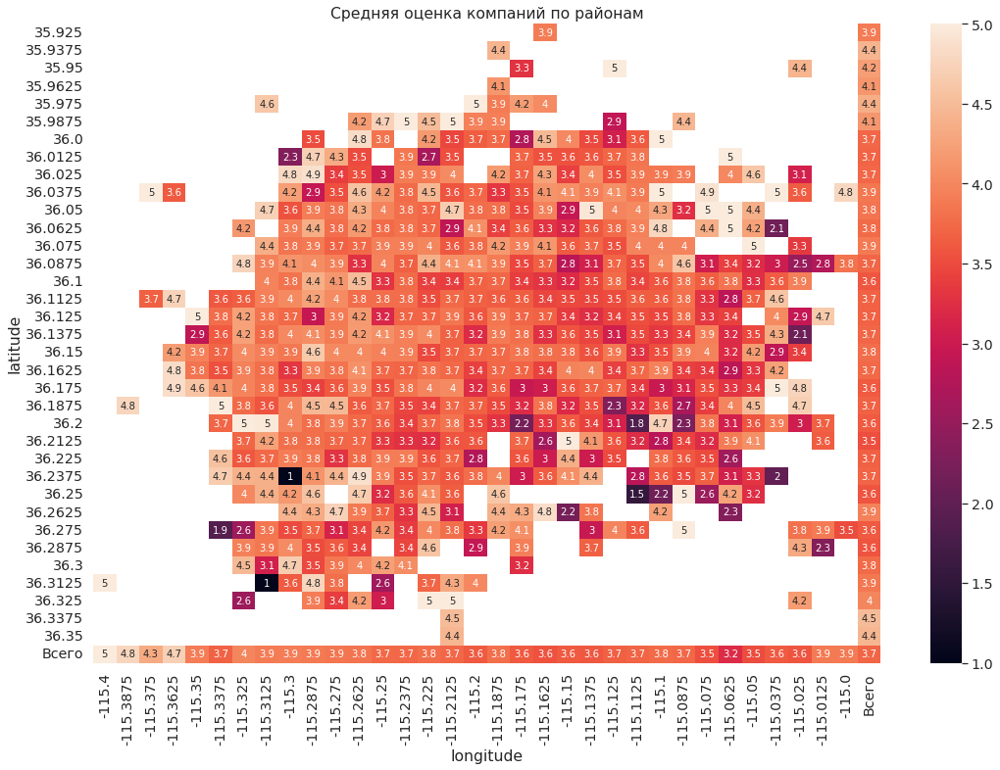

In [125]:
pivot_map = pd.pivot_table(
    data=cell_joined_df, 
    values='stars', 
    columns='longitude',
    index='latitude',  
    aggfunc=np.mean, 
    margins=True,
    margins_name="Всего"
)
fig, ax = plt.subplots(figsize=(18, 12))

sns.heatmap(pivot_map, annot=True, ax=ax, fmt='.2g')
ax.set_title('Средняя оценка компаний по районам')

Полученный график имеет ряд недостатков. Во-первых, не очень правильно судить о районе, если в нем мало компаний. Во-вторых,  на графике цветовая гамма автоматически подстроилась под минимальное и максимальное значения оценки.

Почему эти недостатки могут быть существенными?

**Ответ:** 

1) Если в районе мало компаний, то это не даёт права судить о районе, так как такая оценка может быть статистически неверной

2) Если бы средняя оценка по районам варьировалась не от 1.0 до 5.0, а, например, от 4.8 до 5.0, то цветовая гамма нас дезориентировала бы, так как район с оценкой 4.8 был бы черный, а район с оценкой 5.0 белый, хотя по сути оценка 4.8 не сильно хуже 5.0

Оставьте районы, в которых имеется информация о не менее $30$ компаний. Постройте новый график районов, использовав параметры `vmin` и `vmax` у функции `sns.heatmap`.

In [126]:
cell_joined_df.head()

,latitude,longitude,categories,name,stars,count
business_id,,,,,,
kCoE3jvEtg6UVz5SOD3GVw,36.2125,-115.2625,Real Estate Services;Real Estate;Home Services...,"""BDJ Realty""",4.000000,5
OD2hnuuTJI9uotcKycxg1A,36.2000,-115.2500,Shopping;Sporting Goods,"""Soccer Zone""",1.444444,9
VBHEsoXQb2AQ76J9l8h1uQ,36.0875,-115.1250,Shopping;Jewelry;Watch Repair;Local Services,"""Alfredo's Jewelry""",4.739130,23
1Jp_hmPNUZArNqzpbm7B0g,36.0625,-115.2750,Home Services;Lighting Fixtures & Equipment;Lo...,"""Task Electric""",4.450000,20
DPQnTnNw2PJj7DdENM98Cw,36.1000,-115.0625,Nurseries & Gardening;Home & Garden;Shopping,"""Star Nursery""",3.680000,25


In [127]:
groupped_df = pd.DataFrame(cell_joined_df.groupby(by=['latitude', 'longitude']).sum()['count'])
groupped_df = groupped_df[groupped_df['count'] >= 30].reset_index()
groupped_df.head()

,latitude,longitude,count
0,35.9250,-115.1625,105
1,35.9375,-115.1875,155
2,35.9500,-115.1750,199
3,35.9500,-115.0250,31
4,35.9750,-115.3125,273


In [128]:
groupped_cell = pd.merge(groupped_df, cell_joined_df,  how='left', left_on=['latitude', 'longitude'], 
                         right_on=['latitude', 'longitude'])
groupped_cell.head()

,latitude,longitude,count_x,categories,name,stars,count_y
0,35.925,-115.1625,105,Videographers;Photographers;Event Planning & S...,"""Two Poetic Photography""",1.666667,3
1,35.925,-115.1625,105,Pet Photography;Event Planning & Services;Pet ...,"""Photobetty Photography""",5.000000,5
2,35.925,-115.1625,105,Pest Control;Local Services,"""Armor Pest Defense""",2.400000,10
3,35.925,-115.1625,105,Health & Medical;Orthodontists;General Dentist...,"""Boston Dental""",2.739130,23
4,35.925,-115.1625,105,Hot Tub & Pool;Pool & Hot Tub Service;Shopping...,"""LV Hot Tubs and Spas""",5.000000,9


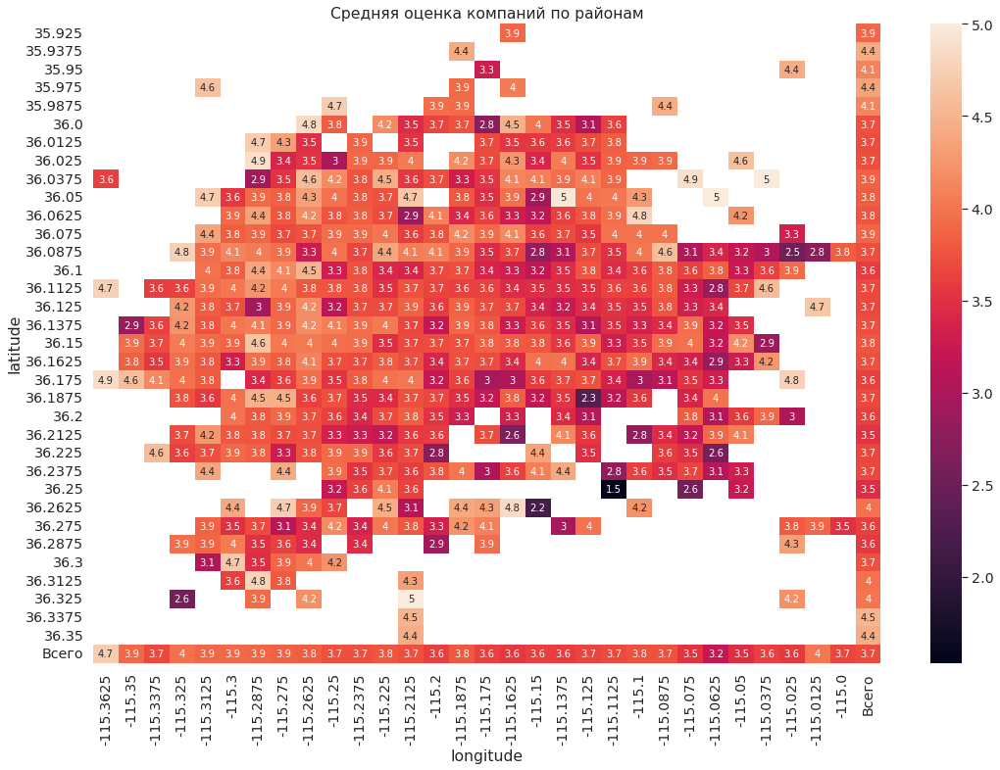

In [129]:
new_pivot_map = pd.pivot_table(
    data=groupped_cell, 
    values='stars', 
    columns='longitude',
    index='latitude',  
    aggfunc=np.mean, 
    margins=True,
    margins_name="Всего"
)
fig, ax = plt.subplots(figsize=(18, 12))

sns.heatmap(new_pivot_map, annot=True, ax=ax, fmt='.2g')
ax.set_title('Средняя оценка компаний по районам')
None

Сравните полученный график с предыдущим и сделайте вывод.

**Вывод**: данные два графика похожи, но второй график более информативен, так как первый может содержать выбросы, а во втором графике даже если выбросы и есть, то их вклад будет не сильно большим из-за наличия других точек в районе

#### Рестораны

Будем считать компанию рестораном, если в поле `categories` *содержится* слово `restaurant`. Обратите внимание, что в анализе данных часто нет четкого формата данных. Например, данное слово может быть написано как с большой буквы, так и с маленькой; может как разделяться `;`, так и не разделяться. При возникновении недопонимания стоит посмотреть данные.

Составьте таблицу, в которой будет информация о всех ресторанах города `N`, для которых имеется не менее $5$ отзывов. Далее постройте heatmap-график районов, в котором каждому району сопоставьте среднюю оценку по ресторанам этого района. Рассматривайте только те районы, в которых есть не менее $10$ ресторанов, для каждого из которых есть не менее $5$ отзывов.

In [ ]:
...

Чем полезны ограничения снизу на количество отзывов для ресторана и количество ресторанов в районе?

**Ответ:** <...>

Кот Василий из города `N` очень придирчив к выбору ресторана. Он доверяет только ресторанам с высоким рейтингом, который основывается на большом количестве отзывов. Напечатайте в виде таблицы информацию $10$ ресторанах с самым большим рейтингом в порядке убывания рейтинга. Для каждого из этих ресторанов должно быть не менее $50$ отзывов. По каждому ресторану необходимо вывести следующую информации: название ресторана, средняя оценка, количество отзывов, географические координаты, категории.

In [ ]:
...

Нанесите на карту все рестораны со средней оценкой не менее $4.7$, которая посчитана по не менее $50$ отзывам. Отдельным цветом отметьте 10 ресторанов, которые вы получили ранее.

In [ ]:
...

Охарактеризуйте кота Василия, а также сделайте общий вывод по задаче.

**Вывод:** <...>